### Notebook for the epithelial label transfer of Reference epithelial dataset to rest of epithelial cells from GCA using `scANVI`

- **Developed by:** Anna Maguza
- **Institute of Computational Biology - Computational Health Department - Helmholtz Munich**
- 17th February 2022

### Import required modules

In [1]:
import scvi
import anndata
import warnings
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import scipy 
from scipy import sparse

/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Global seed set to 0
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/anna.maguza/miniconda3/envs/scvi_env/lib/python3.9/site-packages/flax/struct.py:132: FutureWarnin

In [2]:
from matplotlib import axes
from matplotlib import pylab

### Set up working environment

In [3]:
%matplotlib inline

In [4]:
sc.settings.verbosity = 3
sc.logging.print_versions()
sc.settings.set_figure_params(dpi = 180, color_map = 'magma_r', dpi_save = 300, vector_friendly = True, format = 'svg')

-----
anndata     0.8.0
scanpy      1.9.3
-----
PIL                         9.4.0
absl                        NA
appnope                     0.1.2
asttokens                   NA
attr                        22.2.0
backcall                    0.2.0
beta_ufunc                  NA
binom_ufunc                 NA
brotli                      NA
certifi                     2022.12.07
cffi                        1.15.1
charset_normalizer          2.1.1
chex                        0.1.6
colorama                    0.4.6
comm                        0.1.2
contextlib2                 NA
cycler                      0.10.0
cython_runtime              NA
dateutil                    2.8.2
debugpy                     1.5.1
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
entrypoints                 0.4
executing                   0.8.3
flax                        0.6.1
fsspec                      2023.3.0
h5py                        3.8.0
hypergeom_uf

In [5]:
warnings.simplefilter(action = 'ignore')
scvi.settings.seed = 1712
%config InlineBackend.print_figure_kwargs = {'facecolor' : "w"}
%config InlineBackend.figure_format = 'retina'

Global seed set to 1712


In [6]:
arches_params = dict(
    use_layer_norm = "both",
    use_batch_norm = "none",
    encode_covariates = True,
    dropout_rate = 0.2,
    n_layers = 2,
)

### Read in Reference object

In [7]:
#Cluster path
reference_input = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/Geosketch_subset/Epithelial_cells_Geosketch_subset_reference.h5ad'
reference_output = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/Geosketch_subset/Epithelial_cells_Geosketch_subset_reference_output.h5ad'

In [7]:
#Local machine path
reference_input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_reference.h5ad'
reference_output = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_reference_output.h5ad'

In [8]:
reference = sc.read_h5ad(reference_input)
reference.X

<63860x40144 sparse matrix of type '<class 'numpy.float32'>'
	with 146773223 stored elements in Compressed Sparse Row format>

In [9]:
reference.obs

,UniqueCell_ID,Sample_ID,CellType,Study_name,Donor_ID,Diagnosis,Age,Region code,Fraction,Gender,...,total_counts_mt,doublet_scores,predicted_doublets,Age_group,total_counts_ribo,Location,n_counts,percent_mito,percent_ribo,Cell States
cell_id,,,,,,,,,,,,,,,,,,,,,
AACACGTTCTTGCATT_Ileum-1_Stem Cell,AACACGTTCTTGCATT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,Stem_Cells_ext
AACCGCGCATGAAGTA_Ileum-1_Stem Cell,AACCGCGCATGAAGTA_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,Stem_Cells_ext
AACTCAGAGCGATCCC_Ileum-1_Stem Cell,AACTCAGAGCGATCCC_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,Stem_Cells_ext
AACTCCCTCTCAACTT_Ileum-1_Stem Cell,AACTCCCTCTCAACTT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,Stem_Cells_ext
AACTCTTAGCTTCGCG_Ileum-1_Stem Cell,AACTCTTAGCTTCGCG_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,Stem_Cells_ext
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GACTACATCGGCCGAT-1-WTDAtest7770719,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,2491.4812,0.04612546125461255,False,Adult,4531.0,LargeInt,15872.0,16.005066,28.547127,Stem_Cells_GCA
GATCGATAGATATGGT-1-WTDAtest7770719,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,787.29895,0.05609418282548476,False,Adult,3332.0,LargeInt,9814.0,8.170051,33.951496,Stem_Cells_GCA
TGGGCGTAGCTAGTGG-1-WTDAtest7770719,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,1442.919,0.06539196940726577,False,Adult,4341.0,LargeInt,11534.0,12.742546,37.636555,Stem_Cells_GCA


In [10]:
reference.obs['seed_labels'] = reference.obs['Cell States'].copy()

### Read query object

In [11]:
#Cluster path
query_input = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/Geosketch_subset/Epithelial_cells_Geosketch_subset_query.h5ad'
query_output = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/Geosketch_subset/Epithelial_cells_Geosketch_subset_query_output.h5ad'

In [11]:
#Local machine path
query_input = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_query.h5ad'
query_output = '/Users/anna.maguza/Desktop/Data/Processed_datasets/Geosketch_subsets/Epithelial_cells/Epithelial_cells_Geosketch_subset_query_output.h5ad'

In [12]:
query = sc.read_h5ad(query_input)
query.X

<68575x40144 sparse matrix of type '<class 'numpy.float32'>'
	with 83320888 stored elements in Compressed Sparse Row format>

In [13]:
query.obs['seed_labels'] = 'Unknown'

In [14]:
# Concatenate reference and query
adata = reference.concatenate(query, batch_key = 'dataset', batch_categories = ['reference', 'query'])

In [15]:
del reference, query

### Select HVGs - 3K

In [16]:
adata_raw = adata.copy()

In [ ]:
#sc.pp.filter_cells(adata, min_genes = 200)
#sc.pp.filter_genes(adata, min_cells = 3)

In [17]:
sc.pp.log1p(adata)

In [18]:
adata.layers['counts'] = adata.X.copy()

In [40]:
adata.obs_keys

<bound method AnnData.obs_keys of AnnData object with n_obs × n_vars = 132435 × 3000
    obs: 'UniqueCell_ID', 'Sample_ID', 'CellType', 'Study_name', 'Donor_ID', 'Diagnosis', 'Age', 'Region code', 'Fraction', 'Gender', '10X', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts_mt', 'doublet_scores', 'predicted_doublets', 'Age_group', 'total_counts_ribo', 'Location', 'n_counts', 'percent_mito', 'percent_ribo', 'Cell States', 'seed_labels', 'dataset', '_scvi_batch', '_scvi_labels', 'C_scANVI'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'log1p', 'hvg', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'C_scANVI_colors', 'Cell States_colors', 'CellType_colors', 'dataset_colors', 'Diagnosis_colors', 'Study_name_colors', 'Donor_ID_colors'
    obsm: 'X_scANVI', 'X_umap'
    layers: 'counts'
    obsp: 'distances', 'connectivities'>

In [20]:
adata.obs['Donor_ID'].value_counts()

A33 (414C)    35324
A34 (417C)    18751
F72            8481
A32 (411C)     5586
BRC2121        5572
              ...  
N539              9
N44               8
N49               4
N12               3
T110NEG           2
Name: Donor_ID, Length: 65, dtype: int64

In [21]:
#Calculate how much 'nan' in 'Donor ID' column
adata.obs['Donor_ID'].value_counts()['nan']


KeyError: 'nan'

([0,
  1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64],
 [Text(0, 0, 'A33 (414C)'),
  Text(1, 0, 'A34 (417C)'),
  Text(2, 0, 'F72'),
  Text(3, 0, 'A32 (411C)'),
  Text(4, 0, 'BRC2121'),
  Text(5, 0, 'F73'),
  Text(6, 0, 'BRC2043'),
  Text(7, 0, 'A38 (432C)'),
  Text(8, 0, 'A39 (440C)'),
  Text(9, 0, 'BRC2133'),
  Text(10, 0, 'A26 (386C)'),
  Text(11, 0, 'BRC2258'),
  Text(12, 0, 'BRC2119'),
  Text(13, 0, 'BRC2134'),
  Text(14, 0, 'F66'),
  Text(15, 0, 'A30 (398B)'),
  Text(16, 0, 'F78'),
  Text(17, 0, 'T110POS'),
  Text(18, 0, 'BRC2046'),
  Text(19, 0, 'T036POS'),
  Text(20, 0, 'BRC2049'),
  Text(21, 0, 'T057'),
  Text(22, 0, 'T024'),
  Text(23, 0, 'T044'),
  Text(24

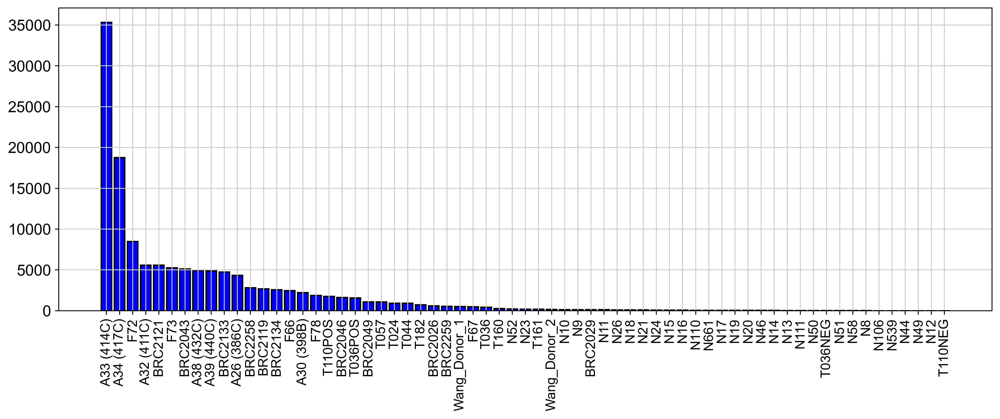

In [21]:
#Create a barplot of the number of cells per cell type in the anndata_pediatric object
plt.figure(figsize = (15, 5))
plt.bar(adata.obs["Donor_ID"].value_counts().index, adata.obs["Donor_ID"].value_counts(), color = "blue", edgecolor = "black", linewidth = 1.2)
plt.xticks(rotation = 90, fontsize = 12)

In [23]:
sc.pp.highly_variable_genes(
    adata,
    flavor = "seurat_v3",
    n_top_genes = 3000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [ ]:
#adata_raw = adata.copy()
#adata.layers['counts'] = adata.X.copy()

### Transfer of annotation with scANVI

In [24]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [25]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [26]:
scvi_model.train(150)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 150/150: 100%|██████████| 150/150 [2:10:40<00:00, 48.25s/it, loss=365, v_num=1]

`Trainer.fit` stopped: `max_epochs=150` reached.


Epoch 150/150: 100%|██████████| 150/150 [2:10:40<00:00, 52.27s/it, loss=365, v_num=1]


### Label transfer with `scANVI` 

In [27]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [28]:
scanvi_model.train(50)

INFO     Training for 50 epochs.                                                                                   


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 50/50: 100%|██████████| 50/50 [1:51:10<00:00, 133.52s/it, loss=467, v_num=1]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [1:51:10<00:00, 133.40s/it, loss=467, v_num=1]


In [29]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [30]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [31]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:57)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:10)


In [32]:
adata.obs

,UniqueCell_ID,Sample_ID,CellType,Study_name,Donor_ID,Diagnosis,Age,Region code,Fraction,Gender,...,Location,n_counts,percent_mito,percent_ribo,Cell States,seed_labels,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
AACACGTTCTTGCATT_Ileum-1_Stem Cell-reference,AACACGTTCTTGCATT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACCGCGCATGAAGTA_Ileum-1_Stem Cell-reference,AACCGCGCATGAAGTA_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCAGAGCGATCCC_Ileum-1_Stem Cell-reference,AACTCAGAGCGATCCC_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCCCTCTCAACTT_Ileum-1_Stem Cell-reference,AACTCCCTCTCAACTT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCTTAGCTTCGCG_Ileum-1_Stem Cell-reference,AACTCTTAGCTTCGCG_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAACTCGTCGCTTTC-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1059.0,15.516024,21.246458,TA,Unknown,query,1,19,Colonocyte
TTAGGACAGAATGTTG-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,984.0,1.1627918,36.78862,TA,Unknown,query,1,19,Colonocyte
TTGCGTCCAGCTGTAT-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1043.0,0.7481268,8.916587,Colonocyte,Unknown,query,1,19,Colonocyte


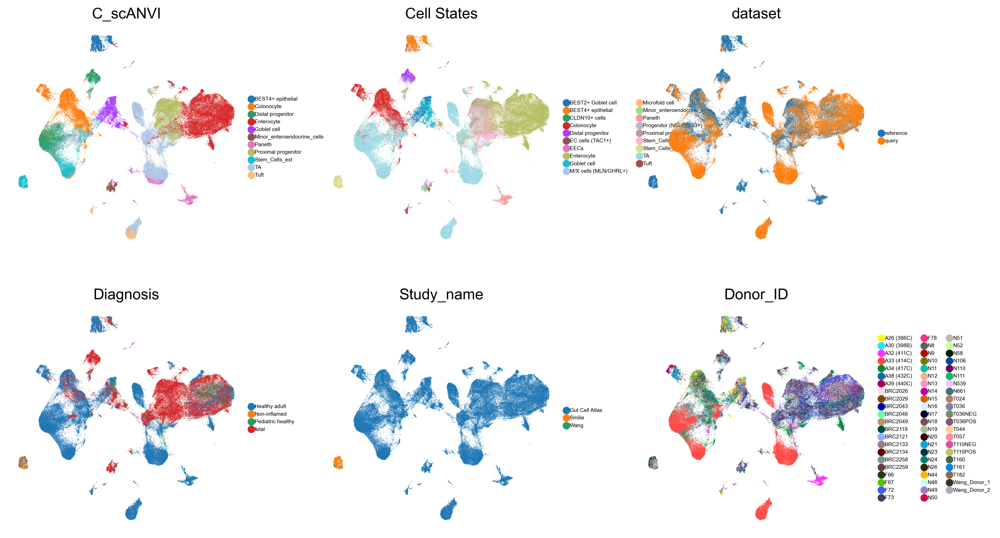

In [34]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Cell States', 'dataset', 'Diagnosis', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [35]:
#Write anndata object to file - cluster path
adata.write_h5ad('/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_3000/Epithelial_cells_after_scanvi_3K_HVG.h5ad')

In [35]:
#Write anndata object to file - local machine path
adata.write_h5ad('/Users/anna.maguza/Desktop/Data/Processed_datasets/post_SCANVI/Epithelial/Epithelial_cells_after_scanvi_3K_HVG.h5ad')

### Models Validation

In [36]:
input_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_3000/Epithelial_cells_after_scanvi_3K_HVG.h5ad'
output_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_3000/Epithelial_cells_after_scanvi_3K_HVG_output.h5ad'
adata = sc.read_h5ad(input_file)

In [36]:
adata.obs['C_scANVI'].value_counts()

Enterocyte                     30282
TA                             27286
Colonocyte                     15384
Proximal progenitor            13873
Distal progenitor              13652
Stem_Cells_ext                  9065
Goblet cell                     7120
BEST4+ epithelial               4866
Paneth                          4855
Tuft                            3962
Minor_enteroendocrine_cells     2090
Name: C_scANVI, dtype: int64

In [37]:
adata.obs['Cell States'].value_counts()

TA                             47700
Enterocyte                     32745
Colonocyte                     13729
Proximal progenitor             8580
Stem_Cells_GCA                  6909
BEST4+ epithelial               4400
Goblet cell                     3965
BEST2+ Goblet cell              2925
Paneth                          2911
Distal progenitor               2775
Stem_Cells_ext                  2508
Tuft                             688
Minor_enteroendocrine_cells      629
Microfold cell                   430
EC cells (TAC1+)                 387
EECs                             371
Progenitor (NEUROG3+)            292
M/X cells (MLN/GHRL+)            268
CLDN10+ cells                    223
Name: Cell States, dtype: int64

Text(0, 0.5, 'Observed')

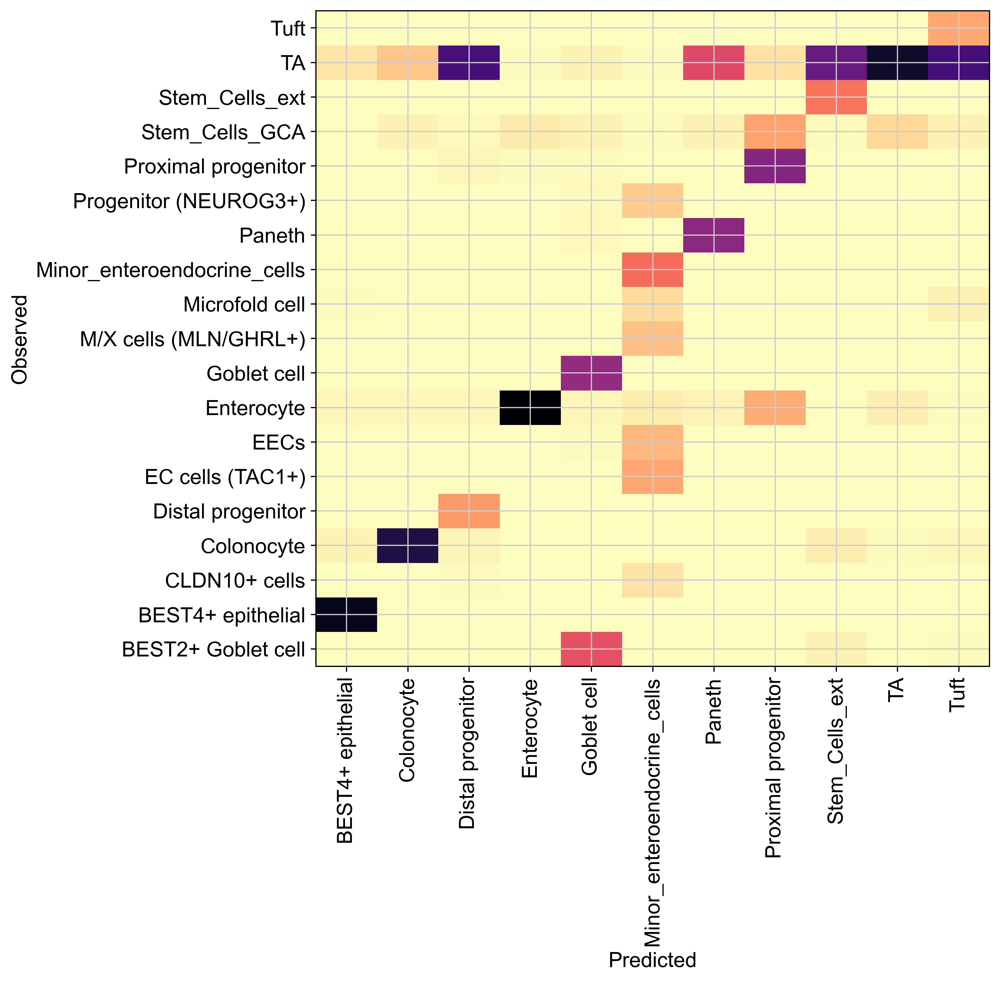

In [38]:
#Validation of the clusters
df = adata.obs.groupby(['Cell States', "C_scANVI"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [39]:
#Calculate accuracy
print(f"Acc: {np.mean(adata.obs['Cell States'].cat.codes == adata.obs['C_scANVI'].cat.codes)}")

Acc: 0.022063653867935212


# 5000 HGV

In [41]:
adata_5000 = adata_raw.copy()

In [42]:
sc.pp.log1p(adata_5000)
adata_5000.layers['counts'] = adata_5000.X.copy()

In [43]:
sc.pp.highly_variable_genes(
    adata_5000,
    flavor = "seurat_v3",
    n_top_genes = 5000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [44]:
scvi.model.SCVI.setup_anndata(adata_5000, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [45]:
scvi_model_5000 = scvi.model.SCVI(adata_5000, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [46]:
scvi_model_5000.train(150)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 150/150: 100%|███████| 150/150 [27:28<00:00, 10.47s/it, loss=883, v_num=1]

`Trainer.fit` stopped: `max_epochs=150` reached.


Epoch 150/150: 100%|███████| 150/150 [27:28<00:00, 10.99s/it, loss=883, v_num=1]


### Label transfer with `scANVI` 

In [47]:
scanvi_model_5000 = scvi.model.SCANVI.from_scvi_model(scvi_model_5000, 'Unknown')

In [48]:
scanvi_model_5000.train(50)

INFO     Training for 50 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|███████████| 50/50 [20:53<00:00, 24.71s/it, loss=972, v_num=1]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|███████████| 50/50 [20:53<00:00, 25.07s/it, loss=972, v_num=1]


In [49]:
adata_5000.obs["C_scANVI"] = scanvi_model_5000.predict(adata_5000)

- Extract latent representation

In [50]:
adata_5000.obsm["X_scANVI"] = scanvi_model_5000.get_latent_representation(adata_5000)

- Visualise corrected dataset

In [51]:
sc.pp.neighbors(adata_5000, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata_5000, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:05)


In [52]:
adata_5000.obs

,UniqueCell_ID,Sample_ID,CellType,Study_name,Donor_ID,Diagnosis,Age,Region code,Fraction,Gender,...,Location,n_counts,percent_mito,percent_ribo,Cell States,seed_labels,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
AACACGTTCTTGCATT_Ileum-1_Stem Cell-reference,AACACGTTCTTGCATT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACCGCGCATGAAGTA_Ileum-1_Stem Cell-reference,AACCGCGCATGAAGTA_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCAGAGCGATCCC_Ileum-1_Stem Cell-reference,AACTCAGAGCGATCCC_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCCCTCTCAACTT_Ileum-1_Stem Cell-reference,AACTCCCTCTCAACTT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
AACTCTTAGCTTCGCG_Ileum-1_Stem Cell-reference,AACTCTTAGCTTCGCG_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Stem_Cells_ext
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAACTCGTCGCTTTC-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1059.0,15.516024,21.246458,TA,Unknown,query,1,19,Colonocyte
TTAGGACAGAATGTTG-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,984.0,1.1627918,36.78862,TA,Unknown,query,1,19,Proximal progenitor
TTGCGTCCAGCTGTAT-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1043.0,0.7481268,8.916587,Colonocyte,Unknown,query,1,19,Colonocyte


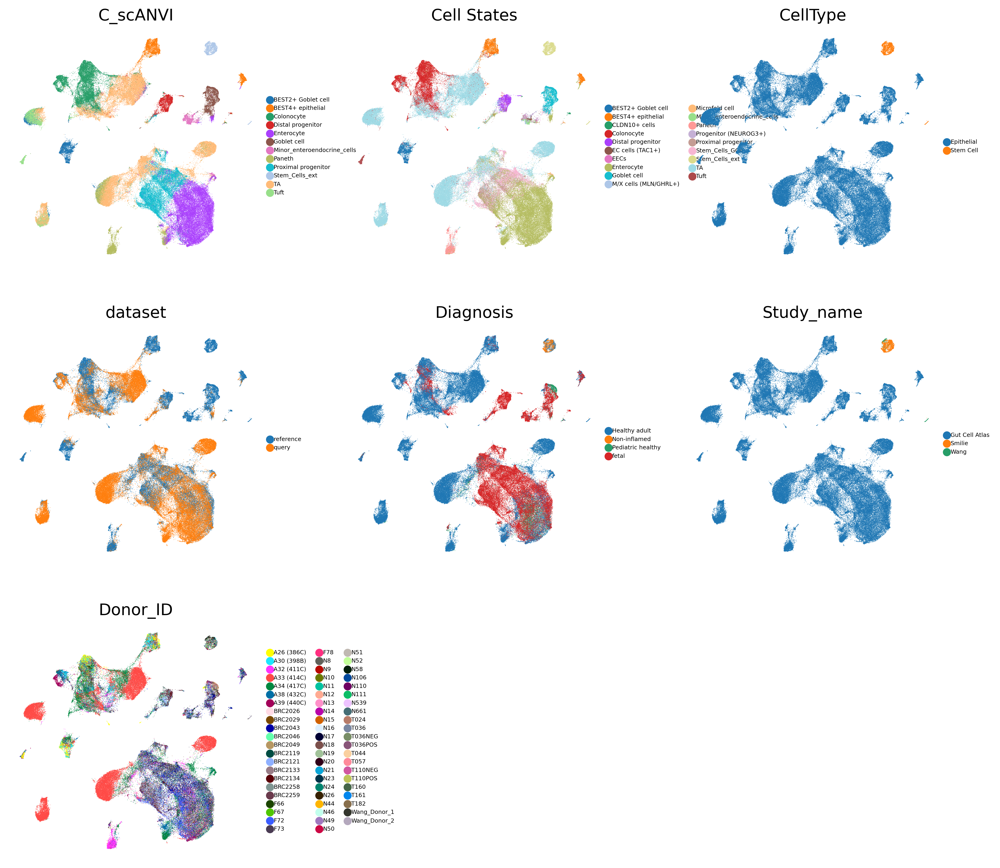

In [53]:
sc.pl.umap(adata_5000, frameon = False, color = ['C_scANVI', 'Cell States', 'CellType', 'dataset', 'Diagnosis', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [54]:
#Write anndata object to file
adata_5000.write_h5ad('/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_5000/Epithelial_cells_after_scanvi_5K_HVG.h5ad')

### Models Validation

In [55]:
input_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_5000/Epithelial_cells_after_scanvi_5K_HVG.h5ad'
output_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_5000/Epithelial_cells_after_scanvi_5K_HVG_output.h5ad'
adata_5000 = sc.read_h5ad(input_file)

In [56]:
adata_5000.obs['C_scANVI'].value_counts()

TA                             37247
Enterocyte                     28225
Proximal progenitor            16244
Colonocyte                     15404
Paneth                          6917
Tuft                            6203
BEST4+ epithelial               5022
Goblet cell                     4307
BEST2+ Goblet cell              4297
Distal progenitor               3725
Stem_Cells_ext                  2557
Minor_enteroendocrine_cells     2287
Name: C_scANVI, dtype: int64

In [57]:
adata_5000.obs['Cell States'].value_counts()

TA                             47700
Enterocyte                     32745
Colonocyte                     13729
Proximal progenitor             8580
Stem_Cells_GCA                  6909
BEST4+ epithelial               4400
Goblet cell                     3965
BEST2+ Goblet cell              2925
Paneth                          2911
Distal progenitor               2775
Stem_Cells_ext                  2508
Tuft                             688
Minor_enteroendocrine_cells      629
Microfold cell                   430
EC cells (TAC1+)                 387
EECs                             371
Progenitor (NEUROG3+)            292
M/X cells (MLN/GHRL+)            268
CLDN10+ cells                    223
Name: Cell States, dtype: int64

Text(0, 0.5, 'Observed')

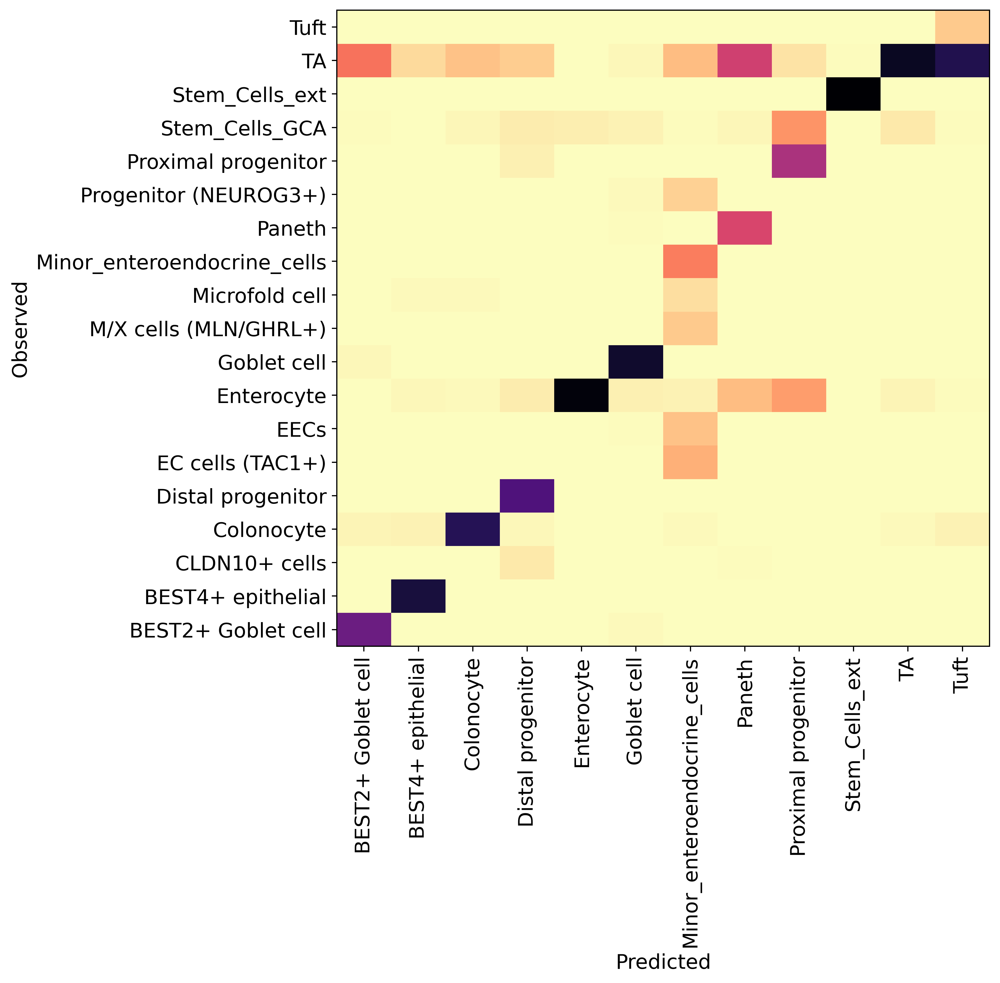

In [58]:
#Validation of the clusters
df = adata_5000.obs.groupby(['Cell States', "C_scANVI"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [59]:
#Calculate accuracy
print(f"Acc: {np.mean(adata_5000.obs['Cell States'].cat.codes == adata_5000.obs['C_scANVI'].cat.codes)}")

Acc: 0.0647789481632499


# 7000 HVG

In [60]:
adata_7000 = adata_raw.copy()

In [61]:
sc.pp.log1p(adata_7000)
adata_7000.layers['counts'] = adata_7000.X.copy()

In [62]:
sc.pp.highly_variable_genes(
    adata_7000,
    flavor = "seurat_v3",
    n_top_genes = 7000,
    layer = "counts",
    batch_key = "Donor_ID",
    subset = True,
    span = 1
)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


### Transfer of annotation with scANVI

In [63]:
scvi.model.SCVI.setup_anndata(adata_7000, batch_key = 'Donor_ID', labels_key = "seed_labels", layer = 'counts')

In [64]:
scvi_model_7000 = scvi.model.SCVI(adata_7000, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [65]:
scvi_model_7000.train(150)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 150/150: 100%|██| 150/150 [27:14<00:00, 10.46s/it, loss=1.96e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=150` reached.


Epoch 150/150: 100%|██| 150/150 [27:14<00:00, 10.89s/it, loss=1.96e+03, v_num=1]


### Label transfer with `scANVI` 

In [66]:
scanvi_model_7000 = scvi.model.SCANVI.from_scvi_model(scvi_model_7000, 'Unknown')

In [67]:
scanvi_model_7000.train(50)

INFO     Training for 50 epochs.                                                                                   


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 50/50: 100%|██████| 50/50 [22:14<00:00, 28.95s/it, loss=2.07e+03, v_num=1]

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████| 50/50 [22:14<00:00, 26.69s/it, loss=2.07e+03, v_num=1]


In [68]:
adata_7000.obs["C_scANVI"] = scanvi_model_7000.predict(adata_7000)

- Extract latent representation

In [69]:
adata_7000.obsm["X_scANVI"] = scanvi_model_7000.get_latent_representation(adata_7000)

- Visualise corrected dataset

In [70]:
sc.pp.neighbors(adata_7000, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata_7000, min_dist = 0.2, spread = 2, random_state = 1712)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:20)


In [71]:
adata_7000.obs

,UniqueCell_ID,Sample_ID,CellType,Study_name,Donor_ID,Diagnosis,Age,Region code,Fraction,Gender,...,Location,n_counts,percent_mito,percent_ribo,Cell States,seed_labels,dataset,_scvi_batch,_scvi_labels,C_scANVI
cell_id,,,,,,,,,,,,,,,,,,,,,
AACACGTTCTTGCATT_Ileum-1_Stem Cell-reference,AACACGTTCTTGCATT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Proximal progenitor
AACCGCGCATGAAGTA_Ileum-1_Stem Cell-reference,AACCGCGCATGAAGTA_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,TA
AACTCAGAGCGATCCC_Ileum-1_Stem Cell-reference,AACTCAGAGCGATCCC_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Paneth
AACTCCCTCTCAACTT_Ileum-1_Stem Cell-reference,AACTCCCTCTCAACTT_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,TA
AACTCTTAGCTTCGCG_Ileum-1_Stem Cell-reference,AACTCTTAGCTTCGCG_Ileum-1_Stem Cell,Ileum-1,Stem Cell,Wang,Wang_Donor_1,Healthy adult,nan,nan,nan,nan,...,nan,nan,nan,nan,Stem_Cells_ext,Stem_Cells_ext,reference,63,16,Proximal progenitor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTAACTCGTCGCTTTC-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1059.0,15.516024,21.246458,TA,Unknown,query,1,19,Colonocyte
TTAGGACAGAATGTTG-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,984.0,1.1627918,36.78862,TA,Unknown,query,1,19,TA
TTGCGTCCAGCTGTAT-1-WTDAtest7770719-query,nan,A30-SCL-6-SC-45N-2,Epithelial,Gut Cell Atlas,A30 (398B),Healthy adult,20-25,SCL,SC-45N,F,...,LargeInt,1043.0,0.7481268,8.916587,Colonocyte,Unknown,query,1,19,Colonocyte


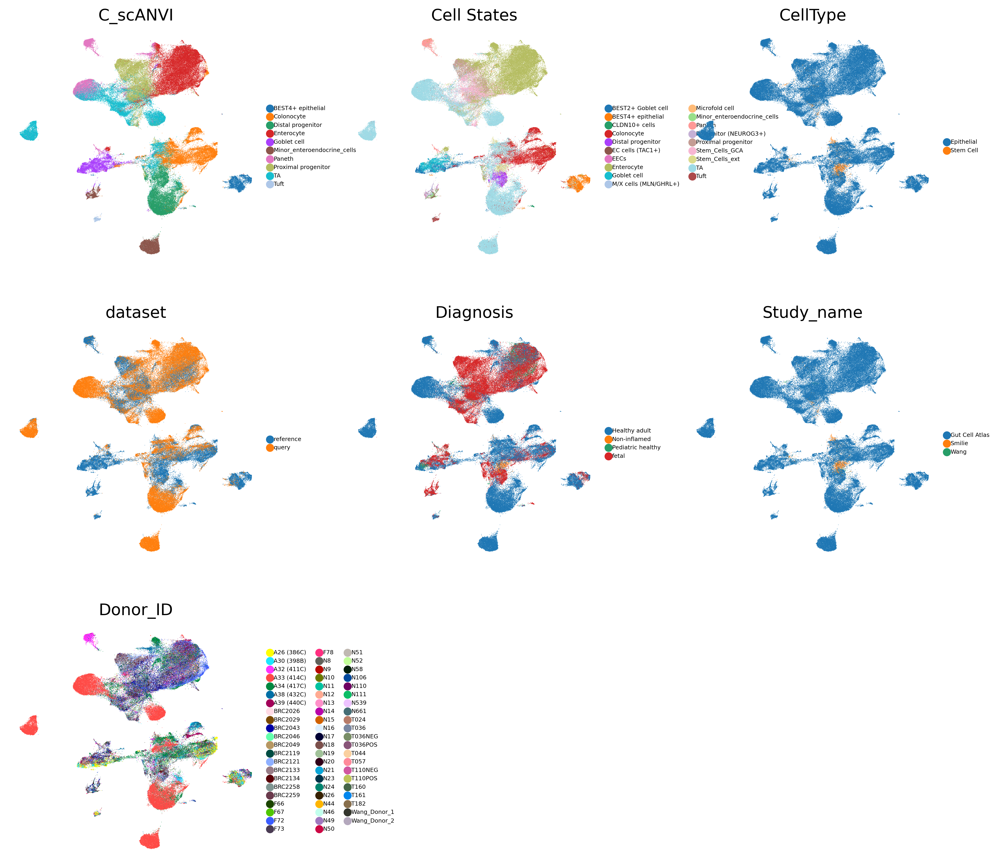

In [72]:
sc.pl.umap(adata_7000, frameon = False, color = ['C_scANVI', 'Cell States', 'CellType', 'dataset', 'Diagnosis', 'Study_name', 'Donor_ID'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [73]:
#Write anndata object to file
adata_7000.write_h5ad('/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_7000/Epithelial_cells_after_scanvi_7K_HVG.h5ad')

### Models Validation

In [74]:
input_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_7000/Epithelial_cells_after_scanvi_7K_HVG.h5ad'
output_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/Reference_maps/GCA_Stem_cells/Epithelial_cells/scANVI/HVG_7000/Epithelial_cells_after_scanvi_7K_HVG_output.h5ad'
adata_7000 = sc.read_h5ad(input_file)

In [75]:
adata_7000.obs['C_scANVI'].value_counts()

Enterocyte                     28136
TA                             24860
Distal progenitor              17278
Colonocyte                     16702
Proximal progenitor            15663
Paneth                          9405
Minor_enteroendocrine_cells     7548
Goblet cell                     6966
BEST4+ epithelial               4962
Tuft                             915
Name: C_scANVI, dtype: int64

In [76]:
adata_7000.obs['Cell States'].value_counts()

TA                             47700
Enterocyte                     32745
Colonocyte                     13729
Proximal progenitor             8580
Stem_Cells_GCA                  6909
BEST4+ epithelial               4400
Goblet cell                     3965
BEST2+ Goblet cell              2925
Paneth                          2911
Distal progenitor               2775
Stem_Cells_ext                  2508
Tuft                             688
Minor_enteroendocrine_cells      629
Microfold cell                   430
EC cells (TAC1+)                 387
EECs                             371
Progenitor (NEUROG3+)            292
M/X cells (MLN/GHRL+)            268
CLDN10+ cells                    223
Name: Cell States, dtype: int64

Text(0, 0.5, 'Observed')

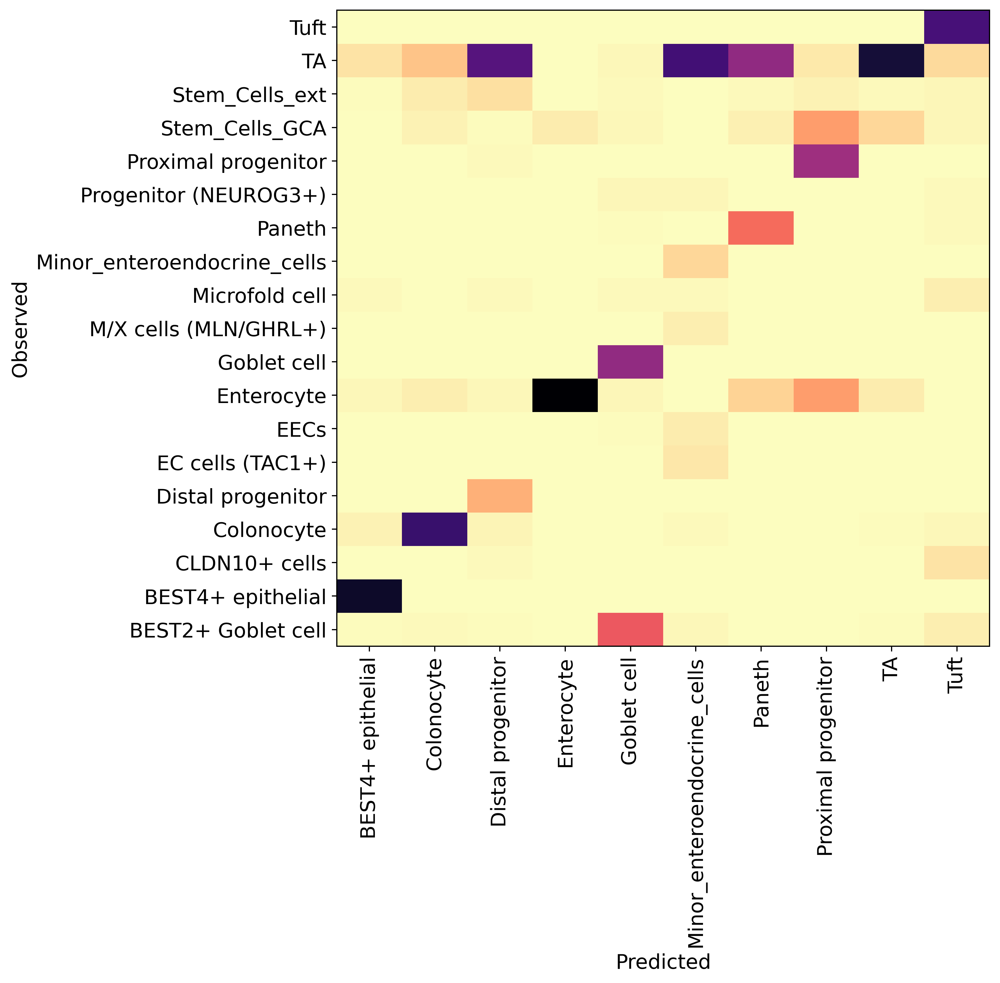

In [77]:
#Validation of the clusters
df = adata_7000.obs.groupby(['Cell States', "C_scANVI"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [78]:
#Calculate accuracy
print(f"Acc: {np.mean(adata_7000.obs['Cell States'].cat.codes == adata_7000.obs['C_scANVI'].cat.codes)}")

Acc: 0.027719258504171857


# Second model

### Select HVGs

In [ ]:
adata_raw = adata.copy()
adata.layers['counts'] = adata.X.copy()

### Transfer of annotation with scANVI

In [ ]:
scvi.model.SCVI.setup_anndata(adata, batch_key = 'Sample_ID', labels_key = "seed_labels", layer = 'counts')

In [ ]:
scvi_model = scvi.model.SCVI(adata, n_latent = 50, n_layers = 3, dispersion = 'gene-batch', gene_likelihood = 'nb')

In [ ]:
scvi_model.train(100)

### Label transfer with `scANVI` 

In [ ]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(scvi_model, 'Unknown')

In [ ]:
scanvi_model.train(25)

In [ ]:
adata.obs["C_scANVI"] = scanvi_model.predict(adata)

- Extract latent representation

In [ ]:
adata.obsm["X_scANVI"] = scanvi_model.get_latent_representation(adata)

- Visualise corrected dataset

In [ ]:
sc.pp.neighbors(adata, use_rep = "X_scANVI", n_neighbors = 50, metric = 'minkowski')
sc.tl.umap(adata, min_dist = 0.2, spread = 2, random_state = 1712)

In [ ]:
adata.obs

In [ ]:
sc.pl.umap(adata, frameon = False, color = ['C_scANVI', 'Integrated_05', 'CellType', 'dataset', 'Diagnosis', 'Study_name'], size = 0.6, legend_fontsize = 5, ncols = 3)

In [ ]:
#Write anndata object to file
adata.write_h5ad('/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/expi_map/Epithelial_cells_after_scanvi2.h5ad')

### Models Validation

In [ ]:
input_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/expi_map/Epithelial_cells_after_scanvi2.h5ad'
output_file = '/lustre/groups/talaveralopez/workspace/anna.maguza/Processed_datasets/expi_map/Epithelial_cells_after_scanvi_output.h5ad'
adata = sc.read_h5ad(input_file)

In [ ]:
adata.obs['C_scANVI'].value_counts()

In [ ]:
adata.obs['Integrated_05'].value_counts()

In [ ]:
#Validation of the clusters
df = adata.obs.groupby(['Integrated_05', "C_scANVI"]).size().unstack(fill_value=0)
norm_df = df / df.sum(axis=0)

plt.figure(figsize=(8, 8))
_ = plt.pcolor(norm_df)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [ ]:
#Calculate accuracy
print(f"Acc: {np.mean(adata.obs.CellType.cat.codes == adata.obs.C_scANVI.cat.codes)}")